In [5]:
from keras.models import load_model
model = load_model('models/vgg16pretrained2.h5')

In [6]:
import pandas as pd
import numpy as np
import os
import cv2

num_classes = 16

X = []
y = []
# is_edible = []

# mushroom_info = pd.read_json('mushroom_classes.json', lines=True)
classdirs = [x for x in os.walk('./witheld')]
for shroomidx, shroom in enumerate(classdirs[0][1]):
#     info = mushroom_info.loc[mushroom_info.name_latin == shroom]
#     edible = info.edibility.isin(("edible", "edible and good", "edible and excellent"))
#     is_edible.append(edible)
    imagepaths = [x for x in os.walk('./witheld\\\\'+shroom)]
    for path in imagepaths[0][2]:
        img = cv2.imread('./witheld\\\\'+shroom+'\\\\'+path,-1)
        if (img.shape == (224, 224, 3)):
            X.append(img)
            y.append(shroomidx)

X = np.stack(X)
y = np.stack(y)
# is_edible = pd.Series(is_edible)
print(X.shape)
print(y.shape)
# print(is_edible.shape)

(80, 224, 224, 3)
(80,)


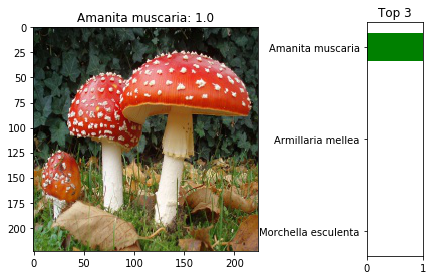

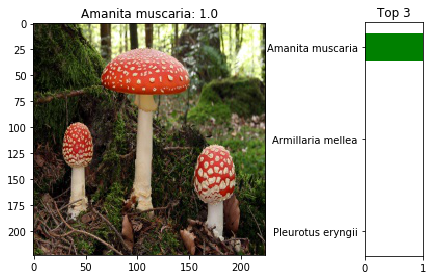

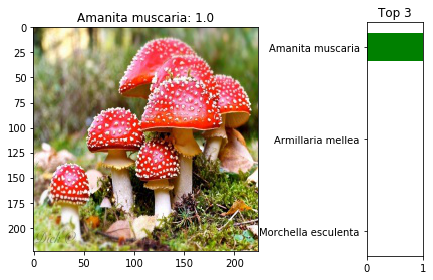

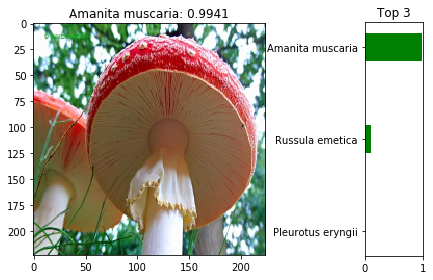

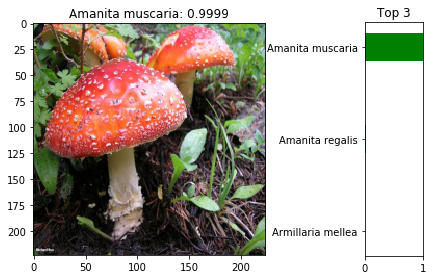

...

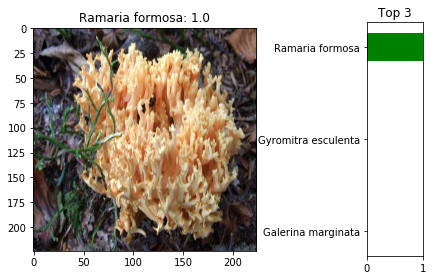

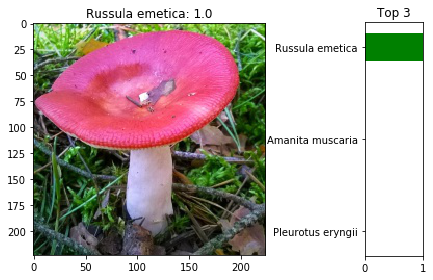

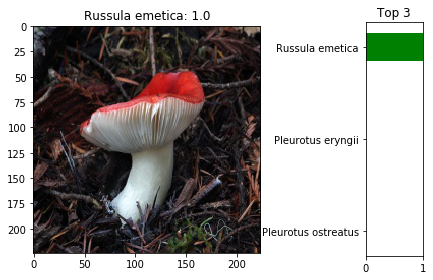

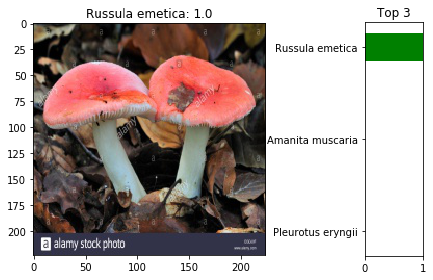

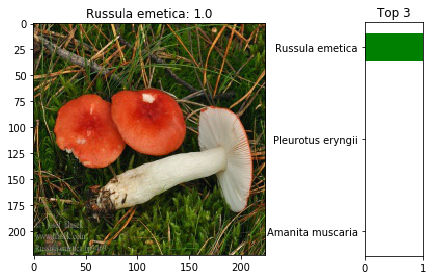

In [8]:
import keras
import random
import matplotlib.pyplot as plt
from matplotlib import gridspec

shroomnames = classdirs[0][1]

def predict_and_draw(i):
    img = X[i]
    # model.summary()
    x = np.expand_dims(img, axis=0)
    output = keras.utils.normalize(model.predict(x/255))
    top3idx = np.argsort(output)[::-1]
    
    top3idx = top3idx[0][-3:]

    top3shrooms = [shroomnames[a] for a in top3idx]
    top3prob = [output[0][a] for a in top3idx]
    
    fig = plt.figure()
    gs = gridspec.GridSpec(1, 2, width_ratios=[4, 1]) 
    ax1 = plt.subplot(gs[0])
    ax1.imshow(img[:,:,[2,1,0]]) # OpenCV is BGR, but is actually RGB
    ax1.set_title(shroomnames[y[i]]+ ": " + str(round(output[0][y[i]],4)))
    
    y_pos = np.arange(len(top3shrooms))
    ax2 = plt.subplot(gs[1])
    ax2.barh(y_pos, top3prob, height=0.3, align='center', color='green')
    ax2.set_xlim(0, 1.0)
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels(top3shrooms)
    ax2.set_title("Top 3")
    plt.tight_layout()
    plt.show()

for i in range(79):
    predict_and_draw(i)
# img = X[i]
# # model.summary()
# x = np.expand_dims(img, axis=0)
# model.predict(x/255)

In [9]:
from keras.utils import plot_model
plot_model(model, show_shapes=True)

ImportError: Failed to import pydot. You must install pydot and graphviz for `pydotprint` to work.